Well here we are in the first assignment, thresholding task. First lets get the numbers.jpg image and look at it.

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


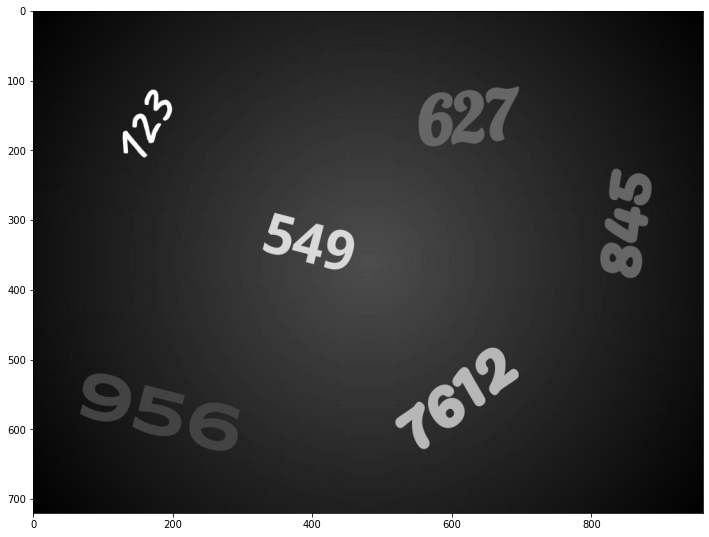

In [284]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import cv2
import numpy as np
import os

%matplotlib inline
from google.colab import drive
drive.mount('/content/drive')

# Read in the image
image = cv2.imread('./numbers.jpg') # use your own image path
image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
plt.figure(figsize=(12,16))
plt.imshow(image, cmap="gray")

Simple Binary Threshold Function

In [213]:

def simpleBT(image, threshold): 
  dim = image.shape
  ourImage = image.copy()
  for i in range(len(ourImage)):#go through every pixel in picture
    for j in range(len(ourImage[i])):
      if ourImage[i,j] > threshold:#change to 255 if greater than thresh else 0
        ourImage[i,j] = 255
      else:
        ourImage[i,j] = 0
  return ourImage

In [215]:
def inverseBT(image, threshold):
  dim = image.shape
  ourImage = image.copy()
  for i in range(len(ourImage)):#go through every pixel in picture
    for j in range(len(ourImage[i])):
      if ourImage[i,j] < threshold:#change to 255 if less than thresh else 0
        ourImage[i,j] = 255
      else:
        ourImage[i,j] = 0
  return ourImage

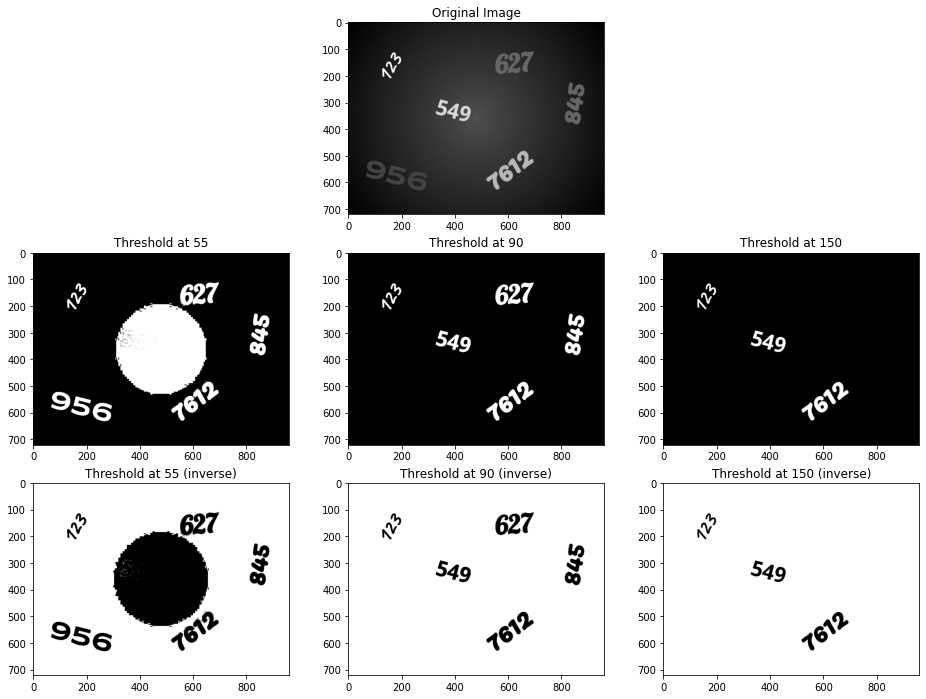

In [224]:

#requested examples
image1 = simpleBT(image, 55)
image2 = simpleBT(image, 90)
image3 = simpleBT(image, 150)
image4 = inverseBT(image, 55)
image5 = inverseBT(image, 90)
image6 = inverseBT(image, 150)


myPlot=plt.figure(figsize=(16,12))

myPlot.add_subplot(3,3, 2)
plt.title("Original Image")
plt.imshow(image, cmap="gray")

myPlot.add_subplot(3,3, 4)
plt.title("Threshold at 55")
plt.imshow(image1, cmap="gray")

myPlot.add_subplot(3,3, 5)
plt.title("Threshold at 90")
plt.imshow(image2, cmap="gray")

myPlot.add_subplot(3,3, 6)
plt.title("Threshold at 150")
plt.imshow(image3, cmap="gray")

myPlot.add_subplot(3,3, 7)
plt.title("Threshold at 55 (inverse)")
plt.imshow(image4, cmap="gray")

myPlot.add_subplot(3,3, 8)
plt.title("Threshold at 90 (inverse)")
plt.imshow(image5, cmap="gray")

myPlot.add_subplot(3,3, 9)
plt.title("Threshold at 150 (inverse)")
plt.imshow(image6, cmap="gray")


How many and which numbers are segmented at each threshold? (A number is considered as segmented if all digits of that number are considered
as foreground in the thresholded image)

Thresh:Numbers (Same for simple and inv)

55:123,627,845,956,7612

90:123,627,845,7612,549

150:123,549,7612

What else do you observe at each
threshold? (3 points)

At a threshhold of 55 there is a circle that appears to block 549, this is removed at higher thresholds. This is because there is a black-white gradient that appears in the original image in the background where values in the middle have a much larger values than those at the outskirts. You need a high threshold to remove the larger values at the middle.


Window Binary Thresholding

In [217]:
def windowBT(image, T1, T2):
  dim = image.shape
  ourImage = image.copy()
  for i in range(len(ourImage)):
   for j in range(len(ourImage[i])):
      if ourImage[i,j] < T1 and ourImage[i,j] > T2:
        ourImage[i,j] = 255
      else:
        ourImage[i,j] = 0
  return ourImage

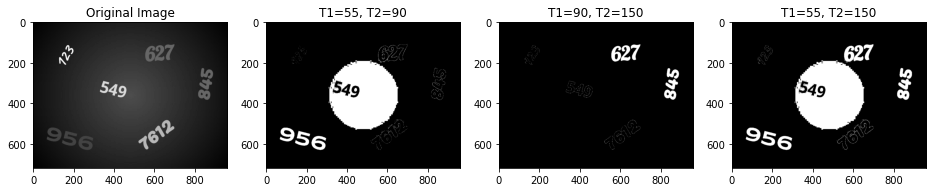

In [219]:
image1 = windowBT(image, 90, 55) #had to swap T1,T2 in order to fix error in document
image2 = windowBT(image, 150, 90)
image3 = windowBT(image, 150, 55)

myPlot=plt.figure(figsize=(16,12))

myPlot.add_subplot(1,4, 1)
plt.title("Original Image")
plt.imshow(image, cmap="gray")

myPlot.add_subplot(1,4, 2)
plt.title("T1=55, T2=90")
plt.imshow(image1, cmap="gray")

myPlot.add_subplot(1,4, 3)
plt.title("T1=90, T2=150")
plt.imshow(image2, cmap="gray")

myPlot.add_subplot(1,4, 4)
plt.title("T1=55, T2=150")
plt.imshow(image3, cmap="gray")

Observations

Circle appears at 55-150 and 55-90 window but this time 549 visible

The outlines of some numbers are included but not the rest, this is due to those pixels being included in the window but not the inner ones.

Segmented Numbers (Window:Numbers)

66-90: 549, 956
55-150: 956,549,627,845
90-150: 627,845

4. I looked at the earlier results for threshold of 150. I noted the only 3 numbers there are 123,549,7612. The question there was does 7612 have the smallest pixels values of the three (if true raise threshold). This turned out to be the case but if it had the highest I would have had to use a window to only get the 2nd and 3rd highest pixel numbers. I then tried 240 but that was too much since it only showed 123. 180 was too much of a change since it still shows all three, then I landed on using a threshold of 200 which did the charm. 

Denoising Question 2

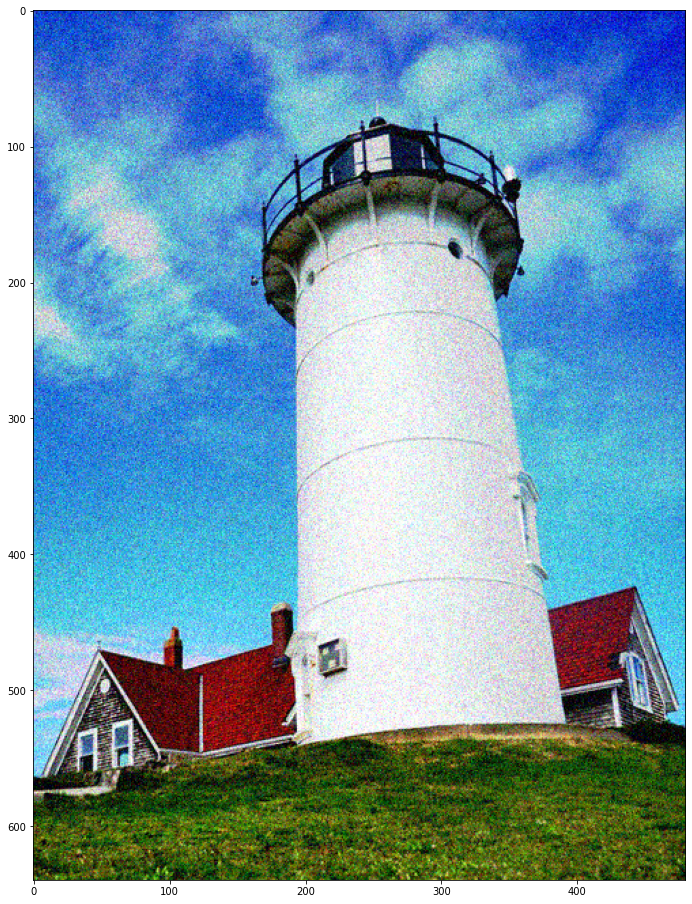

In [283]:
gLighthouse = cv2.imread('./gaussian_lighthouse.png') # use your own image path
gLighthouse = cv2.cvtColor(gLighthouse, cv2.COLOR_BGR2RGB)
lighthouse = cv2.imread('./lighthouse.png') # use your own image path
ighthouse = cv2.cvtColor(lighthouse, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(12,16))
plt.imshow(gLighthouse)

Gaussian Filter

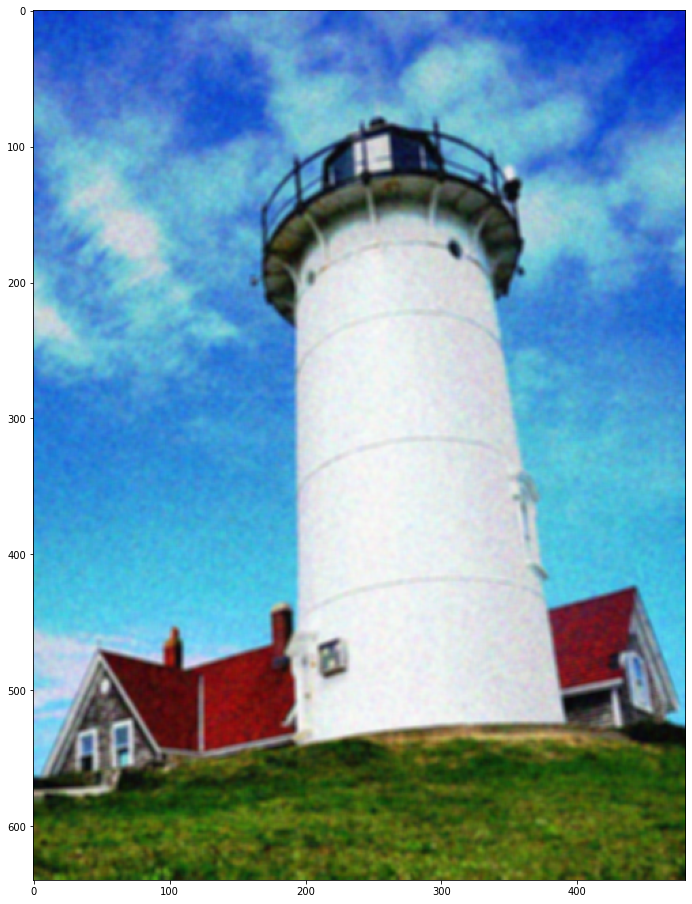

In [227]:
gLighthouse1=gLighthouse.copy()
plt.figure(figsize=(12,16))
gLighthouse1 = cv2.GaussianBlur(gLighthouse1, (5,5), 2) #gaussian filter
plt.imshow(gLighthouse1)

Box Filter

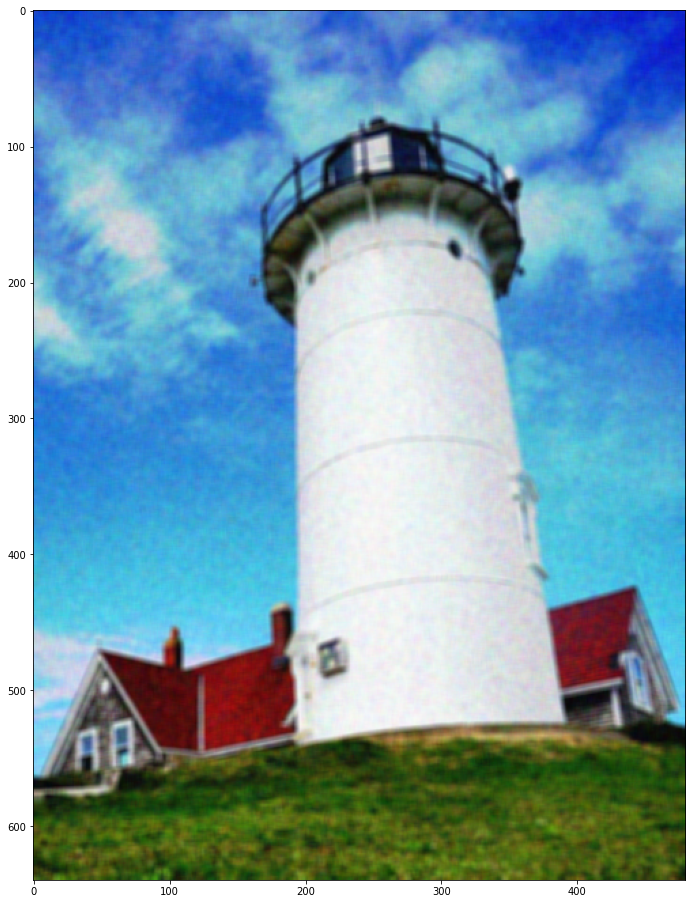

In [228]:
bLighthouse=gLighthouse.copy()
plt.figure(figsize=(12,16))
bLighthouse1 = cv2.blur(bLighthouse, (5,5)) #box filter
plt.imshow(bLighthouse1)

Peak-Signal-to-Noise-Ratio

In [230]:
psnrGaussian = cv2.PSNR(lighthouse, gLighthouse1)
psnrBox = cv2.PSNR(lighthouse, bLighthouse1) #get PSNR vs clean image
print(psnrGaussian)
print(psnrBox)

9.259503499959811
9.248051977893256


Discussion on PSNR

The gaussian filter gave a higher PSNR which means it was the more effective filter in this situation. With a PSNR of 9.25 it just slightly edged out the box filter which had a PSNR of 9.24. This means ratio of I guess meat per say of the image to the noise using the gaussian filter is just a bit better than the box equivalent. 

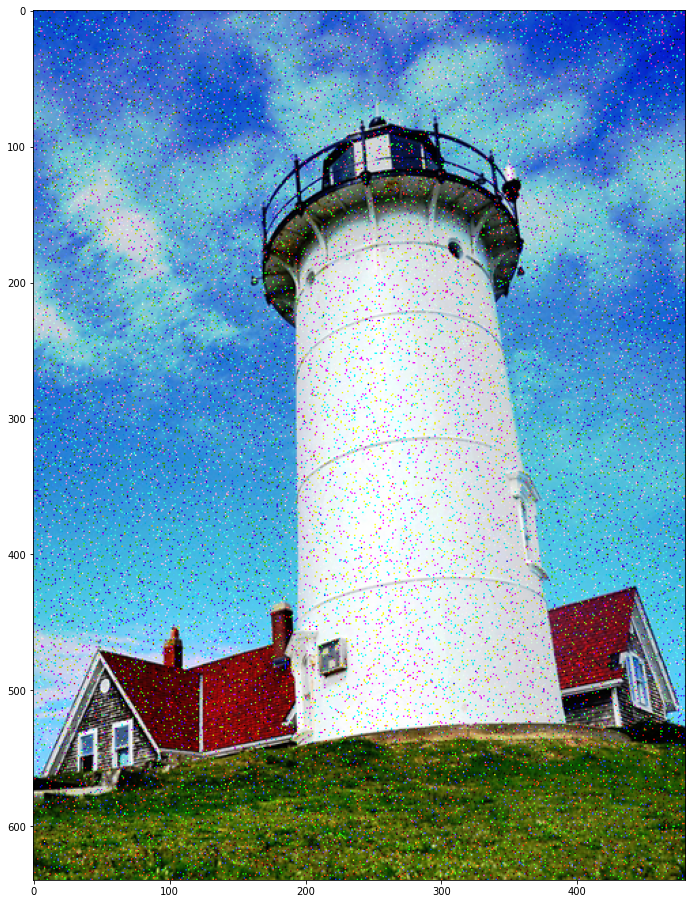

In [233]:
spLighthouse = cv2.imread('./saltandpepper_lighthouse.png')# use your own image path
spLighthouse = cv2.cvtColor(spLighthouse, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(12,16))
plt.imshow(spLighthouse)

Gaussian Filter

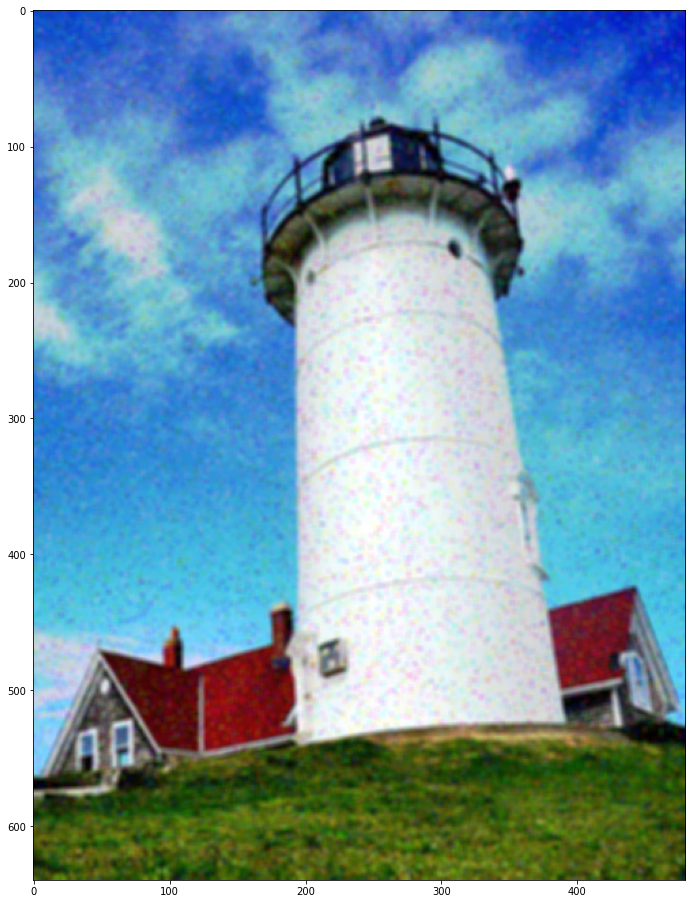

In [234]:
spLighthouse1=spLighthouse.copy()
spLighthouse1 = cv2.GaussianBlur(spLighthouse1, (5,5), 2) #gaussian filter
plt.figure(figsize=(12,16))
plt.imshow(spLighthouse1)

Median Filter

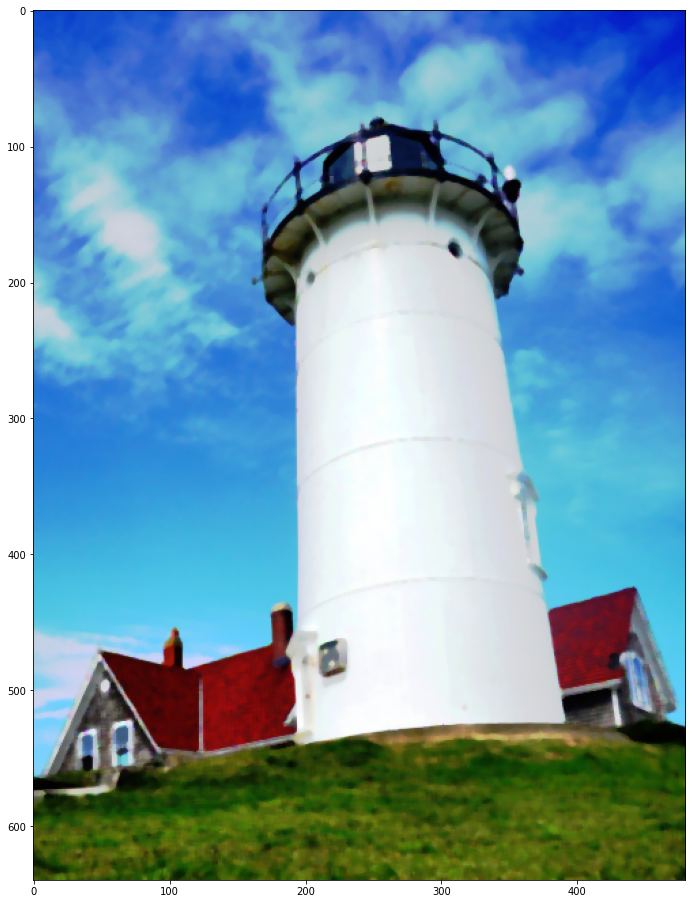

In [235]:
spLighthouse2=spLighthouse.copy()
spLighthouse2 = cv2.cv2.medianBlur(spLighthouse2,5) #meadian filter
plt.figure(figsize=(12,16))
plt.imshow(spLighthouse2)

Peak-Signal-to-Noise-Ratio

In [236]:
psnrGaussian2 = cv2.PSNR(lighthouse, spLighthouse1)
psnrMedian = cv2.PSNR(lighthouse, spLighthouse2)#get PSNR vs clean image
print(psnrGaussian2)
print(psnrMedian)

9.3949825045148
9.205434871029968


Discussion on PSNR

Again the gaussian filter did better than the median filter with a PSNR of 9.39 versus the clean picture. This is competing with median who offered a PSNR of 9.205 compared to the clean picture.

Sobel Edge Detector

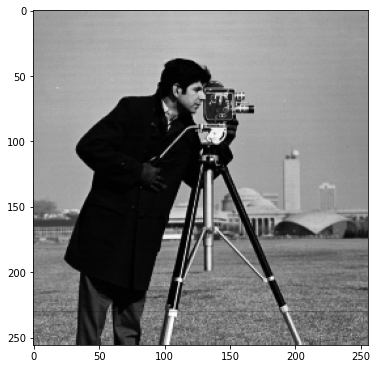

In [239]:
cameraman = cv2.imread('./cameraman.png')# use your own image path
cameraman = cv2.cvtColor(cameraman, cv2.COLOR_BGR2GRAY)
plt.figure(figsize=(6,8))
plt.imshow(cameraman, cmap="gray")

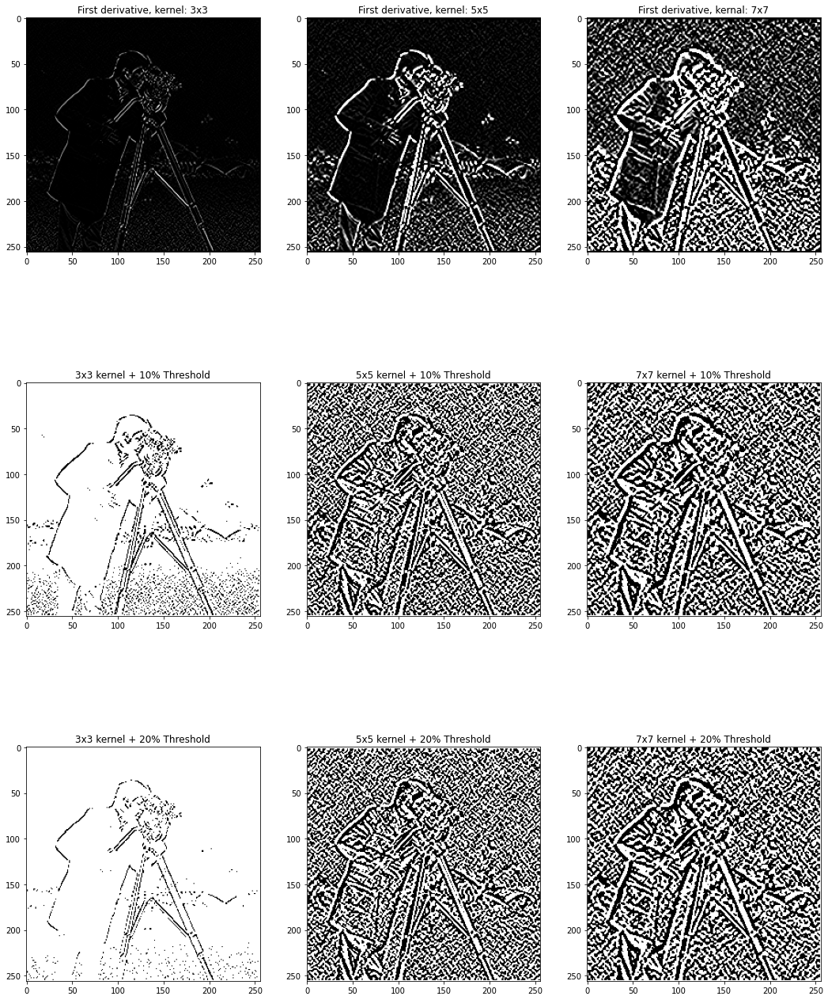

In [242]:
cameramanSobel3 = cv2.Sobel(cameraman,ddepth=-1,dx=1,dy=1,ksize=3) #apply dobel with different kernal sizes
cameramanSobel5 = cv2.Sobel(cameraman,ddepth=-1,dx=1,dy=1,ksize=5)
cameramanSobel7 = cv2.Sobel(cameraman,ddepth=-1,dx=1,dy=1,ksize=7)
#max value in all three is 255 but didn't know if I could assume that so I did it
max3 = 0
max5 = 0
max7 = 0
for array in cameramanSobel3: #find max value in each image
  for element in array:
    if element > max3:
      max3 = element
for array in cameramanSobel5:
  for element in array:
    if element > max3:
      max3 = element
for array in cameramanSobel7:
  for element in array:
    if element > max3:
      max3 = element
tenThresh3, thresh10CamermanSobel3 = cv2.threshold(cameramanSobel3,max3 * 0.1, 255,cv2.THRESH_BINARY_INV) #apply threshold to sobel images as percent of max pixel
tenThresh5, thresh10CamermanSobel5 = cv2.threshold(cameramanSobel5,max5 * 0.1, 255,cv2.THRESH_BINARY_INV)
tenThresh7, thresh10CamermanSobel7 = cv2.threshold(cameramanSobel7,max7 * 0.1, 255,cv2.THRESH_BINARY_INV)
tweThresh3, thresh20CamermanSobel3 = cv2.threshold(cameramanSobel3,max3 * 0.2, 255,cv2.THRESH_BINARY_INV)
tweThresh5, thresh20CamermanSobel5 = cv2.threshold(cameramanSobel5,max5 * 0.2, 255,cv2.THRESH_BINARY_INV)
tweThresh7, thresh20CamermanSobel7= cv2.threshold(cameramanSobel7,max7 * 0.2, 255,cv2.THRESH_BINARY_INV)

myPlot=plt.figure(figsize=(18,24))
myPlot.add_subplot(3,3, 1)
plt.title("First derivative, kernel: 3x3")
plt.imshow(cameramanSobel3, cmap="gray")

myPlot.add_subplot(3,3, 2)
plt.title("First derivative, kernel: 5x5")
plt.imshow(cameramanSobel5, cmap="gray")

myPlot.add_subplot(3,3, 3)
plt.title("First derivative, kernal: 7x7")
plt.imshow(cameramanSobel7, cmap="gray")

myPlot.add_subplot(3,3, 4)
plt.title("3x3 kernel + 10% Threshold")
plt.imshow(thresh10CamermanSobel3, cmap="gray")

myPlot.add_subplot(3,3, 5)
plt.title("5x5 kernel + 10% Threshold")
plt.imshow(thresh10CamermanSobel5, cmap="gray")

myPlot.add_subplot(3,3, 6)
plt.title("7x7 kernel + 10% Threshold")
plt.imshow(thresh10CamermanSobel7, cmap="gray")

myPlot.add_subplot(3,3, 7)
plt.title("3x3 kernel + 20% Threshold")
plt.imshow(thresh20CamermanSobel3, cmap="gray")

myPlot.add_subplot(3,3, 8)
plt.title("5x5 kernel + 20% Threshold")
plt.imshow(thresh20CamermanSobel5, cmap="gray")

myPlot.add_subplot(3,3, 9)
plt.title("7x7 kernel + 20% Threshold")
plt.imshow(thresh20CamermanSobel7, cmap="gray")


Comment on the effect of filter size on the output

It seems the larger the kernal the more details are picked up, which means more edges, though many edges could be considered noise. The threshholds help remove the noise the bigger the threshold the more weak edges we are removing. 


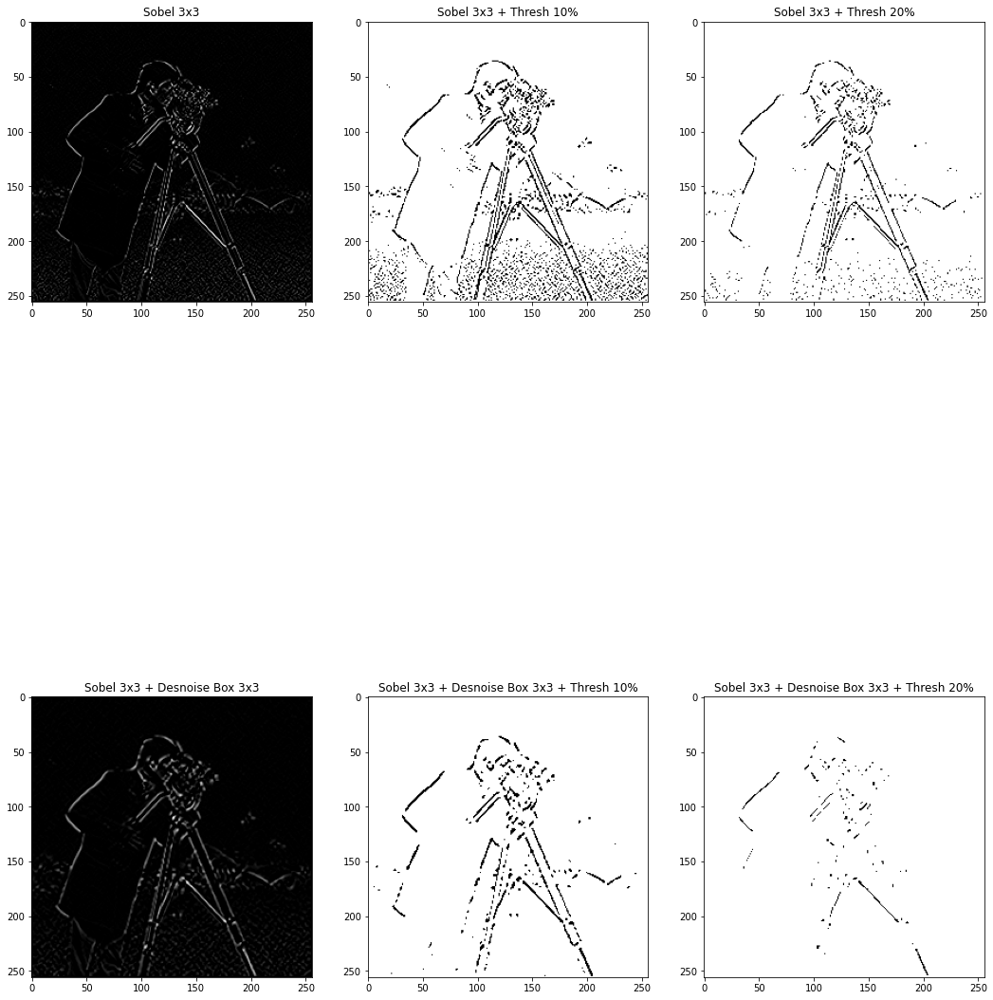

In [245]:
#Part 1 (Same as last part)
cameramanSobel3_try2 = cv2.Sobel(cameraman,ddepth=-1,dx=1,dy=1,ksize=3)
tenThresh3, thresh10CameramanSobel3_try2 = cv2.threshold(cameramanSobel3_try2,max3 * 0.1, 255,cv2.THRESH_BINARY_INV)
tweThresh3, thresh20CameramanSobel3_try2 = cv2.threshold(cameramanSobel3_try2,max3 * 0.2, 255,cv2.THRESH_BINARY_INV)
#Part 2 (with denoising)
denoisedCameraman = cv2.blur(cameraman, (3,3))
denoisedCameramanSobel = cv2.Sobel(denoisedCameraman,ddepth=-1,dx=1,dy=1,ksize=3)
tenThresh3_d, thresh10CameramanSobel3_Denoised = cv2.threshold(denoisedCameramanSobel,max3 * 0.1, 255,cv2.THRESH_BINARY_INV)
tweThresh3_d, thresh20CameramanSobel3_Denoised = cv2.threshold(denoisedCameramanSobel,max3 * 0.2, 255,cv2.THRESH_BINARY_INV)

myPlot=plt.figure(figsize=(18,24))
myPlot.add_subplot(2,3, 1)
plt.title("Sobel 3x3")
plt.imshow(cameramanSobel3_try2, cmap="gray")

myPlot.add_subplot(2,3, 2)
plt.title("Sobel 3x3 + Thresh 10%")
plt.imshow(thresh10CameramanSobel3_try2, cmap="gray")

myPlot.add_subplot(2,3, 3)
plt.title("Sobel 3x3 + Thresh 20%")
plt.imshow(thresh20CameramanSobel3_try2, cmap="gray")

myPlot.add_subplot(2,3, 4)
plt.title("Sobel 3x3 + Desnoise Box 3x3")
plt.imshow(denoisedCameramanSobel, cmap="gray")

myPlot.add_subplot(2,3, 5)
plt.title("Sobel 3x3 + Desnoise Box 3x3 + Thresh 10%")
plt.imshow(thresh10CameramanSobel3_Denoised, cmap="gray")

myPlot.add_subplot(2,3, 6)
plt.title("Sobel 3x3 + Desnoise Box 3x3 + Thresh 20%")
plt.imshow(thresh20CameramanSobel3_Denoised, cmap="gray")



Comment on the effectiveness of using denoising prior to edge detection

Denoising helps significantly to only get the strongest edges when you run edge detection. This is because it removes lots of the weak edges from noise we don't want in thge background, so the edge detector never picks up on them.

Canny Edge Detection

Briefly describe the 4 main steps of Canny edge detection

1. Filter image with x, y derivatives of Gaussian (this will be done for us with the gaussianblur function) Simply put use a gaussian filter on the image to reduce noise.
2. Find magnitude and orientation of the gradient, you can do this using the dobel operation. This will give the directions of edges for each pixel.
3. Non Maximum Supression here you are checking if along an edge another pixel has a stronger intensity. If one exists suppress other weak pixels. You use the directions of edges from last step to run this check.
4. Threshholding and linking (hysteresis) we assign two thresholds. Some pixels are strong enough they definately contribute to the final edge, some are weak enough that they should not be included. Some are somewhere in between and will be made strong is they are nearby other strong ones.

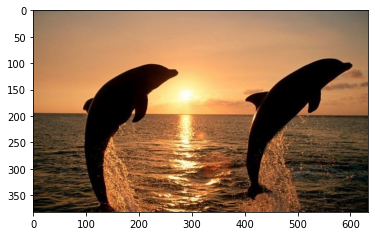

In [247]:
dolphin = cv2.imread('./dolphin.jpg')# use your own image path
dolphin = cv2.cvtColor(dolphin, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(6,8))
plt.imshow(dolphin)

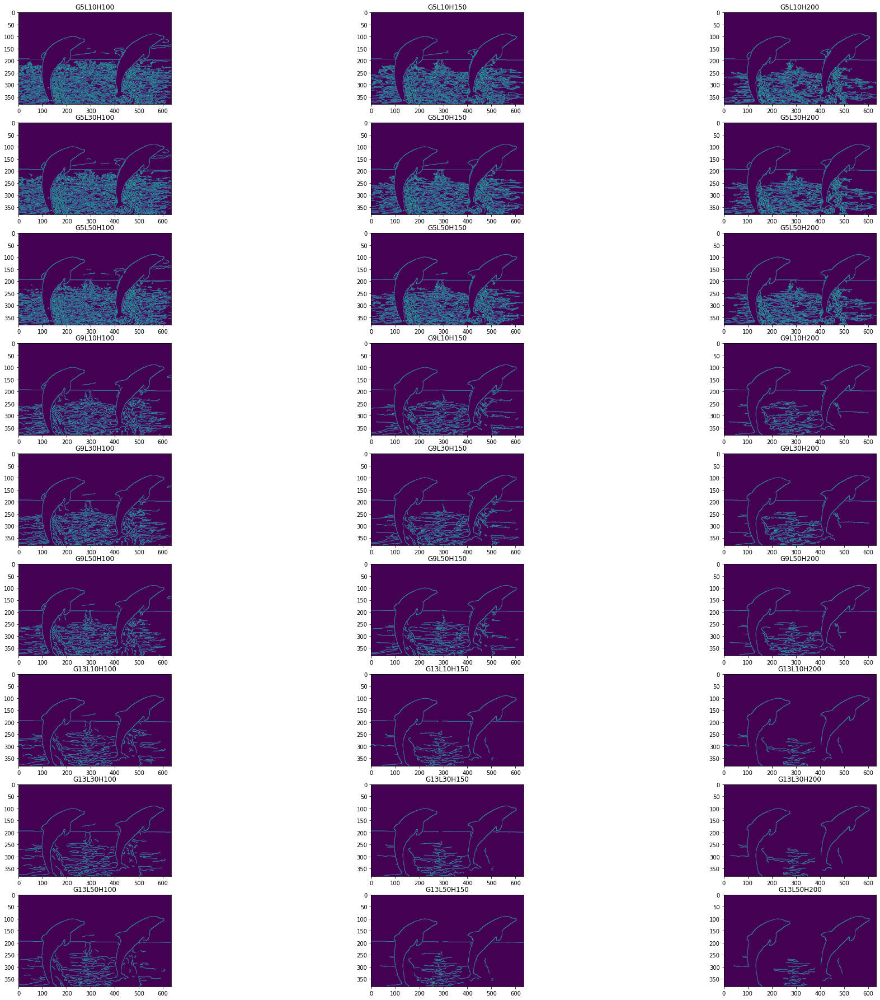

In [248]:
#(K = 5,9,13, L = 10,30,50, H = 100,150,200)
dolphinG5 = cv2.GaussianBlur(dolphin, (5,5), 0, 0) #gaussian with three kernal sizes
dolphinG9 = cv2.GaussianBlur(dolphin, (9,9), 0, 0)
dolphinG13 = cv2.GaussianBlur(dolphin, (13,13), 0, 0)

dolphinG5L10H100 = cv2.Canny(dolphinG5, 10, 100) #canny with all combinations of hyperparameters
dolphinG5L10H150 = cv2.Canny(dolphinG5, 10, 150)
dolphinG5L10H200 = cv2.Canny(dolphinG5, 10, 200)
dolphinG5L30H100 = cv2.Canny(dolphinG5, 30, 100)
dolphinG5L30H150 = cv2.Canny(dolphinG5, 30, 150)
dolphinG5L30H200 = cv2.Canny(dolphinG5, 30, 200)
dolphinG5L50H100 = cv2.Canny(dolphinG5, 50, 100)
dolphinG5L50H150 = cv2.Canny(dolphinG5, 50, 150)
dolphinG5L50H200 = cv2.Canny(dolphinG5, 50, 200)

dolphinG9L10H100 = cv2.Canny(dolphinG9, 10, 100)
dolphinG9L10H150 = cv2.Canny(dolphinG9, 10, 150)
dolphinG9L10H200 = cv2.Canny(dolphinG9, 10, 200)
dolphinG9L30H100 = cv2.Canny(dolphinG9, 30, 100)
dolphinG9L30H150 = cv2.Canny(dolphinG9, 30, 150)
dolphinG9L30H200 = cv2.Canny(dolphinG9, 30, 200)
dolphinG9L50H100 = cv2.Canny(dolphinG9, 50, 100)
dolphinG9L50H150 = cv2.Canny(dolphinG9, 50, 150)
dolphinG9L50H200 = cv2.Canny(dolphinG9, 50, 200)

dolphinG13L10H100 = cv2.Canny(dolphinG13, 10, 100)
dolphinG13L10H150 = cv2.Canny(dolphinG13, 10, 150)
dolphinG13L10H200 = cv2.Canny(dolphinG13, 10, 200)
dolphinG13L30H100 = cv2.Canny(dolphinG13, 30, 100)
dolphinG13L30H150 = cv2.Canny(dolphinG13, 30, 150)
dolphinG13L30H200 = cv2.Canny(dolphinG13, 30, 200)
dolphinG13L50H100 = cv2.Canny(dolphinG13, 50, 100)
dolphinG13L50H150 = cv2.Canny(dolphinG13, 50, 150)
dolphinG13L50H200 = cv2.Canny(dolphinG13, 50, 200)

myPlot=plt.figure(figsize=(32,32))

myPlot.add_subplot(9,3, 1)
plt.title("G5L10H100")
plt.imshow(dolphinG5L10H100)
myPlot.add_subplot(9,3, 2)
plt.title("G5L10H150")
plt.imshow(dolphinG5L10H150)
myPlot.add_subplot(9,3, 3)
plt.title("G5L10H200")
plt.imshow(dolphinG5L10H200)
myPlot.add_subplot(9,3, 4)
plt.title("G5L30H100")
plt.imshow(dolphinG5L30H100)
myPlot.add_subplot(9,3, 5)
plt.title("G5L30H150")
plt.imshow(dolphinG5L30H150)
myPlot.add_subplot(9,3, 6)
plt.title("G5L30H200")
plt.imshow(dolphinG5L30H200)
myPlot.add_subplot(9,3, 7)
plt.title("G5L50H100")
plt.imshow(dolphinG5L50H100)
myPlot.add_subplot(9,3, 8)
plt.title("G5L50H150")
plt.imshow(dolphinG5L50H150)
myPlot.add_subplot(9,3, 9)
plt.title("G5L50H200")
plt.imshow(dolphinG5L50H200)

myPlot.add_subplot(9,3, 10)
plt.title("G9L10H100")
plt.imshow(dolphinG9L10H100)
myPlot.add_subplot(9,3, 11)
plt.title("G9L10H150")
plt.imshow(dolphinG9L10H150)
myPlot.add_subplot(9,3, 12)
plt.title("G9L10H200")
plt.imshow(dolphinG9L10H200)
myPlot.add_subplot(9,3, 13)
plt.title("G9L30H100")
plt.imshow(dolphinG9L30H100)
myPlot.add_subplot(9,3, 14)
plt.title("G9L30H150")
plt.imshow(dolphinG9L30H150)
myPlot.add_subplot(9,3, 15)
plt.title("G9L30H200")
plt.imshow(dolphinG9L30H200)
myPlot.add_subplot(9,3, 16)
plt.title("G9L50H100")
plt.imshow(dolphinG9L50H100)
myPlot.add_subplot(9,3, 17)
plt.title("G9L50H150")
plt.imshow(dolphinG9L50H150)
myPlot.add_subplot(9,3, 18)
plt.title("G9L50H200")
plt.imshow(dolphinG9L50H200)

myPlot.add_subplot(9,3, 19)
plt.title("G13L10H100")
plt.imshow(dolphinG13L10H100)
myPlot.add_subplot(9,3, 20)
plt.title("G13L10H150")
plt.imshow(dolphinG13L10H150)
myPlot.add_subplot(9,3, 21)
plt.title("G13L10H200")
plt.imshow(dolphinG13L10H200)
myPlot.add_subplot(9,3, 22)
plt.title("G13L30H100")
plt.imshow(dolphinG13L30H100)
myPlot.add_subplot(9,3, 23)
plt.title("G13L30H150")
plt.imshow(dolphinG13L30H150)
myPlot.add_subplot(9,3, 24)
plt.title("G13L30H200")
plt.imshow(dolphinG13L30H200)
myPlot.add_subplot(9,3, 25)
plt.title("G13L50H100")
plt.imshow(dolphinG13L50H100)
myPlot.add_subplot(9,3, 26)
plt.title("G13L50H150")
plt.imshow(dolphinG13L50H150)
myPlot.add_subplot(9,3, 27)
plt.title("G13L50H200")
plt.imshow(dolphinG13L50H200)

Comment on how changing values of each hyper-parameters (K,L,U) effects the overall edge detection. Is there is any relationship between any
hyper-parameters? 

- Increasing kernal size gives less edges
- Increasing H gives more edges
- Increasing L gives less edges but less significant change then increasing H
  - Could be due to fact that we are increasing L by 10 and H by 50 each time

This would lead you to think you should take low kernal size to get max edges and then a very small threshold values. Though if you do that you end up with too many edges. I think high kernal size and medium threshold values gives a good balance and a nice result

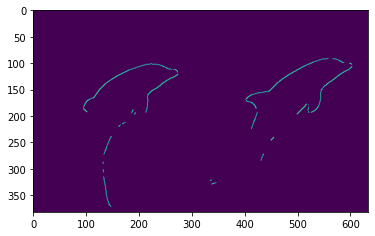

In [249]:
#Find a value of each hyper-parameter such that only dolphin edges are
#detected.
dolphinG13L100H200 = cv2.Canny(dolphinG13, 255, 255)
plt.figure(figsize=(6,8))
plt.imshow(dolphinG13L100H200 )

Harris Corner Detection

In [250]:
def harris(input_image, threshold, circleSize): #as percentage of max value
  inputCopy = input_image.copy()
  input_image = cv2.cvtColor(input_image, cv2.COLOR_RGB2GRAY)#make a grayscale copy for working, will overlay on regular image
  #sobel filters
  Kx = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], np.float32)
  Ky = np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]], np.float32)
#1. Compute image derivatives in the y and x direction
  I_x = cv2.filter2D(input_image, cv2.CV_64F, Kx)
  I_y = cv2.filter2D(input_image, cv2.CV_64F, Ky)
#2. Square of derivatives
  I_x2 = I_x**2
  I_y2 = I_y**2
  I_xy = I_x * I_y
#3. Apply gausian filter
  GI_x2 = cv2.GaussianBlur(I_x2, (5,5), 2)
  GI_y2 = cv2.GaussianBlur(I_y2, (5,5), 2)
  GI_xy = cv2.GaussianBlur(I_xy, (5,5), 2)
#4. Get cornerless response function
  har = GI_x2*GI_y2 - (GI_xy**2) - 0.05*(GI_x2+GI_y2)**2
#5. Apply non-max suppression    
  max = 0
  for array in har:
    for element in array: #find max value
      if (element > max):
        max = element
  threshold = max*(threshold/100) #make threshold a percentage of max value
  M, N = har.shape   
  nonMaxHar = har.copy()
  for i in range(1,M-1): #apply threshold to image
      for j in range(1,N-1): 
        if (nonMaxHar[i,j] < threshold):
          nonMaxHar[i,j] = 0
#6. Add circles
  # list all points higher than threshold
  loc = np.where(nonMaxHar >= threshold)
  # loop though points
  for pt in zip(*loc[::-1]):
    cv2.circle(inputCopy, pt, circleSize, (255,0,0), -1)
    
  myPlot=plt.figure(figsize=(12,12))

  myPlot.add_subplot(3,3, 1)
  plt.title("G(I_x2)")
  plt.imshow(GI_x2, cmap="gray")
  myPlot.add_subplot(3,3, 2)
  plt.title("G(I_y2)")
  plt.imshow(GI_y2, cmap="gray")
  myPlot.add_subplot(3,3, 3)
  plt.title("G(I_xy)")
  plt.imshow(GI_xy, cmap="gray")
  myPlot.add_subplot(3,3, 4)
  plt.title("harris")
  plt.imshow(har, cmap="gray")
  myPlot.add_subplot(3,3, 5)
  plt.title("harris + non-max")
  plt.imshow(nonMaxHar, cmap="gray")
  myPlot.add_subplot(3,3, 6)
  plt.title("Final Image")
  plt.imshow(inputCopy, cmap="gray")

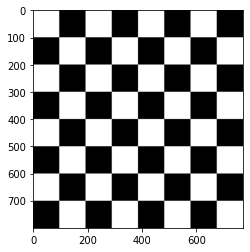

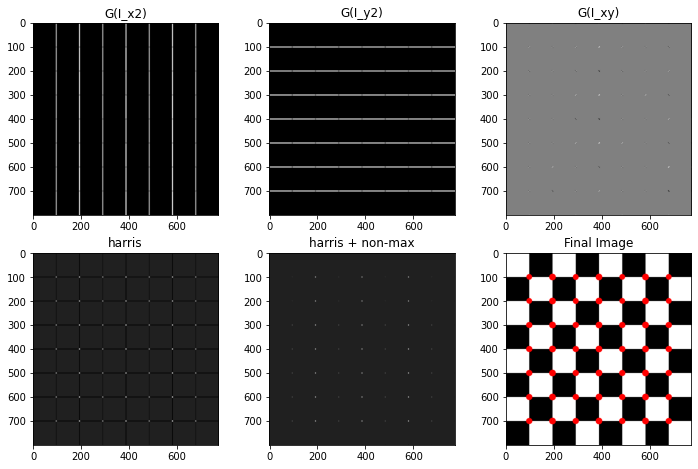

In [270]:
#Get image
checkerboard = cv2.imread('./checkerboard.png') # use your own image path
plt.figure(figsize=(4,4))
plt.imshow(checkerboard)
harris(checkerboard,60, 12) 

Observe and
report affect of changing threshold value

This is a very cut and dry case. If you have a threshold anywhere greater than 0 and less than 60% you get the desired result. 0 will call everything a corner since and above 60% you lose out on a few of the corners the higher the value the more corners you lose. You can see from the harris + non-max graph that not all corners are rated equally. Some are stronger than others which explains that.

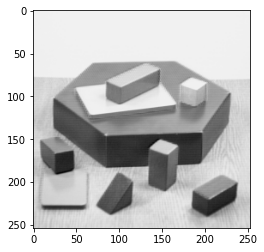

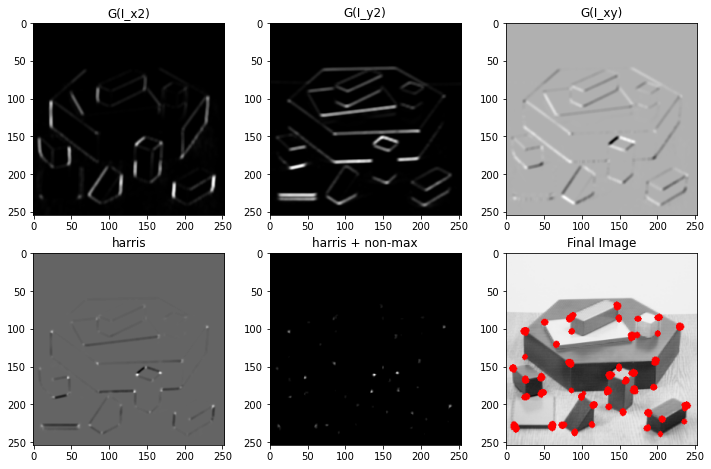

In [180]:
shapes = cv2.imread('./shapes.png') # use your own image path
plt.figure(figsize=(4,4))
plt.imshow(shapes)
harris(shapes, 2, 3)

Try different value of thresholds and report
your observations

A small threshold of 2 gives you almost all the corners with out showing everything. Which is more or less what we are looking for. I can identify 6 missing corners and 2 items that are not corners. But raising the value even a bit losed some of the true corners and decreasing makes it consider almost everything a corner. 

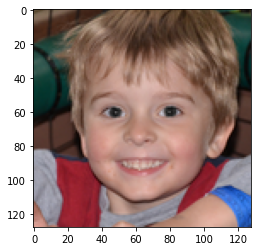

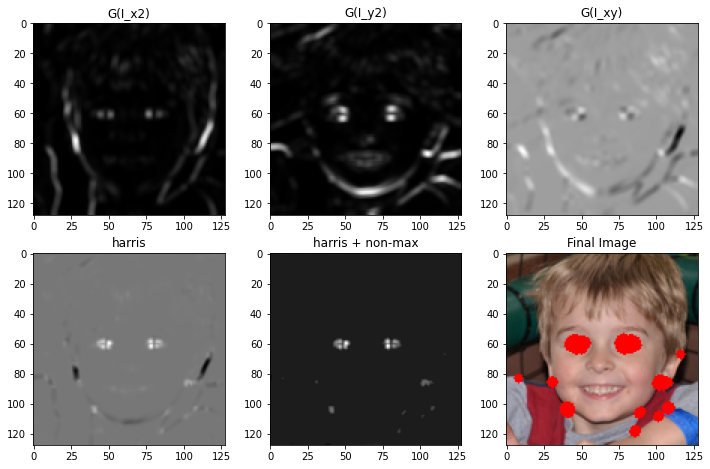

In [264]:
face = cv2.imread('./kidFace.png') # use your own image path, face used will be specifies in readme
RGB_Face = cv2.cvtColor(face, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(4,4))
plt.imshow(RGB_Face)
harris(RGB_Face, 10, 3)

Try different value of thresholds and report your observations

This was the hardes example, the algorithm has a very hard time with the eyes where almost all parts were considered a corner. This is why they are saturated with corners. Raising the threshold made the eyes a bit cleaner but you lost all those other corners since the eyes are the strongest corners. Reducing the threshold to 5 persay gave many false corners. Had I used directional detection in my non max suppresion this might have went a lot better but it wasn't needed for the first checkerboard and mycourses suggested I didn't need to. 